# Seasonal top-N storms by exceedance metrics: historical vs future

For each pair of GCM-driven simulations (historical 1980-2014 vs future 2063-2097),
we extract the most extreme extratropical cyclones in the NNA2 region
(lon in [-90, -60], lat in [40, 50]) and compare HIST vs FUT along two
complementary axes of severity:

- **Cumulative excess** $EE_{V,cum|ETC}$ -- favours long-lived / widespread storms.
- **Regularized intensity** $\overline{EE_V} \cdot T_{ETC}/(T_{ETC}+\lambda)$ --
  favours the most violent storms per grid-point-hour, while down-weighting
  storms whose high mean intensity rests on a handful of exceeding cells.

The selection is **stratified by season** (DJF / MAM / JJA / SON): the top-N
storms are taken per season per period, so that JJA/SON-dominated samples do
not crowd out the other seasons.

Four figure types are produced for each variable (precipitation, 10 m wind):

1. **Cumulative-excess plane**: occurrence $T_{ETC}$ vs mean intensity
   $\overline{EE_V}$ of the seasonal top-N storms selected by cumulative excess.
   Since $EE_{V,cum|ETC} = \overline{EE_V} \cdot T_{ETC}$ is the product of the two
   axes, the accumulation appears as iso-lines (hyperbolae); a HIST$\rightarrow$FUT
   arrow per season shows whether the change is driven by occurrence or intensity
   and how much accumulation it gains or loses.
2. **Cumulative-excess trajectories**: tracks of those storms.
3. **Intensity rank**: sorted mean intensity vs rank for the seasonal top-N
   storms selected by regularized intensity.
4. **Intensity trajectories**: tracks of the intensity-selected storms.

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.lines import Line2D
from matplotlib.markers import MarkerStyle
from matplotlib.patches import PathPatch, Patch
from matplotlib.transforms import Affine2D
import cartopy
import cartopy.crs as ccrs
import random
import sys

sys.path.append('/home/vdemeyer/TRACKING/KATJA/POSTPROCESSING')
from ETC_tools import open_df

plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 16,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.linewidth': 1.0,
    'axes.grid': False,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'axes.labelsize': 16,
    'axes.titlesize': 18,
    'legend.fontsize': 14,
})

## Setup: constants, palettes, simulation labels

In [2]:
base = '/home/vdemeyer/projects/rrg-gachon/vdemeyer'
pairs = [('UBD', 'UBG'), ('UBE', 'UBH'), ('UBF', 'UBI')]
FUTURE_SIMS = {'UBG', 'UBH', 'UBI'}

# Aggregate pickle suffix (must match aggregate_storm_percentile_metrics.ipynb).
mask = 'land'
mtag = 'urbanonly' if mask == 'urban' else 'landonly'
region = 'NNA2'
region_tag = f'_{region}' if region is not None else ''
wetdays = False
future = False
add_file = ''
if wetdays:
    add_file += '_wetdays'

# Region bounding box (must match REGION_BOXES['NNA2'] in storm_percentile_metrics.py).
REGION_BOX = {'west_lon': -90.0, 'east_lon': -60.0, 'south_lat': 40.0, 'north_lat': 50.0}

# Number of top storms kept per season per simulation in every figure.
N_PER_SEASON = 10

# Default regularization strength for intensity-based selection.
LAMBDA = 10000

PERCENTILES = [99, 999]
PCT_LABEL = {99: '99th', 999: '99.9th'}
PCT_QUANTILE = {99: 99.0, 999: 99.9}

sim_label = {
    'UBD': r'CRCM6$_{\mathbf{EC\text{-}Earth3\text{-}Veg}}$',
    'UBG': r'CRCM6$_{\mathbf{EC\text{-}Earth3\text{-}Veg}}$',
    'UBE': r'CRCM6$_{\mathbf{MPI\text{-}ESM1\text{-}2\text{-}HR}}$',
    'UBH': r'CRCM6$_{\mathbf{MPI\text{-}ESM1\text{-}2\text{-}HR}}$',
    'UBF': r'CRCM6$_{\mathbf{MIROC6}}$',
    'UBI': r'CRCM6$_{\mathbf{MIROC6}}$',
}

# HIST/FUT colour palette (used for markers, lines, tracks).
C_HIST = '#2166ac'
C_FUT  = '#b2182b'

# Season encoding: marker shape carries the season on scatter/rank plots;
# season colour carries it on trajectory plots and as marker fill on the rank.
SEASONS = ['DJF', 'MAM', 'JJA', 'SON']
SEASON_MARKER = {'DJF': 'o', 'MAM': 's', 'JJA': '^', 'SON': 'D'}
SEASON_COLOR = {'DJF': '#7c4fa0', 'MAM': '#2ca02c', 'JJA': '#ffd92f', 'SON': '#c97f23'}

def month_to_season(m):
    if m in (12, 1, 2): return 'DJF'
    if m in (3, 4, 5):  return 'MAM'
    if m in (6, 7, 8):  return 'JJA'
    return 'SON'

def _sim_period(sim):
    return (2063, 2097) if sim in FUTURE_SIMS else (1980, 2014)

## Load storm exceedance metrics and per-simulation tracking data

In [3]:
# Per-storm exceedance metrics (one DataFrame per simulation, per percentile).
data_pct = {pct: {} for pct in PERCENTILES}
for sim in {s for pair in pairs for s in pair}:
    start_year, end_year = _sim_period(sim)
    suffix = add_file + ('_future_percentile' if (future and sim in FUTURE_SIMS) else '')
    pkl = f'{base}/{sim}/STORM_RELATED/STORM_METRICS/storm_exceed_metrics_{mtag}{region_tag}_{sim}_{start_year}-{end_year}{suffix}.pkl'
    df_full = pd.read_pickle(pkl)
    df_full['season'] = df_full['initiation_date'].dt.month.map(month_to_season)
    for pct in PERCENTILES:
        data_pct[pct][sim] = df_full[df_full['quantile'] == PCT_QUANTILE[pct]].copy()
        print(f'[{PCT_LABEL[pct]}] {sim}: {len(data_pct[pct][sim])} storms')

# Tracking DataFrames are loaded lazily and cached: large files, only needed by
# the trajectory plots.
tracks_cache = {}
def load_tracks(sim):
    if sim not in tracks_cache:
        tracks_cache[sim] = open_df(sim, period_filtering=False)
    return tracks_cache[sim]

[99th] UBH: 8941 storms
[99.9th] UBH: 8941 storms
[99th] UBG: 8566 storms
[99.9th] UBG: 8566 storms
[99th] UBI: 9736 storms
[99.9th] UBI: 9736 storms
[99th] UBE: 9100 storms
[99.9th] UBE: 9100 storms
[99th] UBF: 10151 storms
[99.9th] UBF: 10151 storms
[99th] UBD: 9420 storms
[99.9th] UBD: 9420 storms


## Selection helpers

`add_regularized_intensity` adds a column $I_{reg} = \overline{EE_V} \cdot T/(T+\lambda)$
for intensity-based selection. `seasonal_top` returns the top-N storms per season,
either by cumulative excess (`select_by='cum'`) or by regularized intensity
(`select_by='intensity'`).

In [4]:
def _resolve_lambda(lambda_, pct):
    """Allow `lambda_` to be either a scalar or a dict keyed by percentile tag."""
    if isinstance(lambda_, dict):
        return lambda_[pct]
    return lambda_

def add_regularized_intensity(df, metric_var, lam):
    cnt = df[f'count_exceed_{metric_var}'].astype(float).values
    inten = df[f'mean_excess_{metric_var}'].astype(float).values
    out = df.copy()
    if lam == 0:
        out[f'ireg_{metric_var}_lam{lam}'] = np.where(cnt > 0, inten, np.nan)
    else:
        out[f'ireg_{metric_var}_lam{lam}'] = inten * (cnt / (cnt + lam))
    return out

def seasonal_top(df, metric_var, select_by, n_per_season=N_PER_SEASON, lam=None):
    """Concatenated top-`n_per_season` storms per season for one (sim, pct).

    `select_by='cum'`       -> sort by cum_excess_{metric_var}
    `select_by='intensity'` -> sort by regularized intensity (requires `lam`).
    """
    if select_by == 'intensity':
        df = add_regularized_intensity(df, metric_var, lam)
        sel_col = f'ireg_{metric_var}_lam{lam}'
    else:
        sel_col = f'cum_excess_{metric_var}'
    out = []
    for season in SEASONS:
        sub = df[df['season'] == season]
        if len(sub) == 0:
            continue
        out.append(sub.nlargest(n_per_season, sel_col))
    if not out:
        return df.iloc[:0]
    return pd.concat(out, ignore_index=True)

## Build the NNA2 region mask

Built on the CRCM6 rotated-pole grid (lon/lat box intersected with the land mask)
so it can be drawn as a contour on the trajectory plots.

In [5]:
_dummy = xr.open_mfdataset('/home/vdemeyer/projects/rrg-gachon/vdemeyer/UBB/PR/pr_ubb_199102_se.nc')
POLE_LON = _dummy.rotated_pole.attrs['grid_north_pole_longitude']
POLE_LAT = _dummy.rotated_pole.attrs['grid_north_pole_latitude']
POLECRS = ccrs.RotatedPole(pole_longitude=POLE_LON, pole_latitude=POLE_LAT)

_dslol = xr.open_dataset(f'{base}/ALL/MASK/CRCM6_lsmsk.nc4')
_region_mask = (
    (_dummy.lon >= REGION_BOX['west_lon']) &
    (_dummy.lon <= REGION_BOX['east_lon']) &
    (_dummy.lat >= REGION_BOX['south_lat']) &
    (_dummy.lat <= REGION_BOX['north_lat']) &
    (_dslol.sftlf > 0)
)
MASK_REGION = xr.DataArray(
    np.zeros((len(_dummy['rlat']), len(_dummy['rlon']))),
    coords={'rlat': _dummy['rlat'], 'rlon': _dummy['rlon']},
    dims=['rlat', 'rlon'])
MASK_REGION = xr.where(_region_mask, 1, MASK_REGION).compute()
print(f'{region} region mask cells:', int(MASK_REGION.sum().item()))

NNA2 region mask cells: 12406


## Plotting functions

### Cumulative-excess plane: occurrence vs mean intensity with accumulation iso-lines

A single panel per (percentile, GCM pair). Because the accumulation
$EE_{V,cum|ETC} = \overline{EE_V} \cdot T_{ETC}$ is the product of the two axes,
lines of constant accumulation are hyperbolae -- drawn as fixed reference
"contours". Each season shows its transparent cloud of individual top-N storms
(outliers stay visible), its opaque median, and a HIST$\rightarrow$FUT arrow whose
direction reveals the driver (occurrence vs intensity) and whose crossing of the
iso-lines reveals the accumulation change.

In [6]:
def plot_seasonal_scatter(metric_var, units, iso_levels=None, n_per_season=N_PER_SEASON):
    """Occurrence vs mean intensity plane, with accumulation as iso-lines.

    The storm accumulation EE_{V,cum|ETC} = mean_excess * occurrence is the product
    of the two axes (x = occurrence T_ETC, y = mean excess intensity), so lines of
    constant accumulation are hyperbolae (mean_excess = const / T). They are drawn
    as fixed reference "contours" (like elevation lines on a topographic map), with
    the accumulation value inlined on each curve: a season whose HIST->FUT segment
    runs toward the upper-right gained accumulation, one running toward the
    lower-left lost it -- read directly off the plane, no marker size.

    2 rows (percentiles) x 3 cols (GCM pairs). Per panel and per season:
      - individual top-N storms as a transparent cloud (shape = season, colour = period),
        so outliers stay visible;
      - the per-season median, opaque, as a larger outlined marker;
      - a straight segment from the HIST median to the FUT median: its *direction*
        tells whether the change is driven by occurrence (horizontal) or intensity
        (vertical), and how many iso-lines it crosses tells the accumulation change.

    Parameters
    ----------
    iso_levels : dict {pct: list of accumulation values} or None
        Explicit accumulation iso-levels per percentile (e.g. {99: [...], 999: [...]}).
        Edit this at the call site to add/remove curves. A percentile absent from the
        dict (or iso_levels=None) falls back to an automatic sparse 1-2-5 x 10^k grid.
        Levels are always clipped to each panel's reachable accumulation range.
    """
    cum_col = f'cum_excess_{metric_var}'
    cnt_col = f'count_exceed_{metric_var}'
    int_col = f'mean_excess_{metric_var}'
    var_math = 'PR' if metric_var == 'pr' else 'WS'

    MARKER_SIZE = 70    # individual-storm marker area (transparent cloud)
    MED_SIZE = 190      # per-season median marker area (opaque)

    iso_levels = iso_levels or {}

    def _auto_iso_levels(lo, hi):
        """Fallback: round 1-2-5 x 10^k accumulation values spanning [lo, hi]
        (sparse, so small-value iso-lines do not crowd together)."""
        if not (np.isfinite(lo) and np.isfinite(hi)) or lo <= 0:
            return []
        levels = []
        k = int(np.floor(np.log10(lo)))
        while True:
            for m in (1, 2, 5):
                v = m * 10.0 ** k
                if v >= lo and v <= hi:
                    levels.append(v)
            k += 1
            if 10.0 ** k > hi:
                break
        return sorted(set(levels))

    def _iso_levels(pct, lo, hi):
        """Levels for this panel: explicit list if provided for `pct`, else
        automatic, always clipped to the reachable accumulation range [lo, hi]."""
        base = iso_levels.get(pct)
        if base is None:
            base = _auto_iso_levels(lo, hi)
        return np.array([v for v in base if lo <= v <= hi])

    # First pass: panel selections + per-row shared axis limits.
    selections = {}
    row_x = {r: [np.inf, -np.inf] for r in range(len(PERCENTILES))}
    row_y = {r: [np.inf, -np.inf] for r in range(len(PERCENTILES))}
    for row, pct in enumerate(PERCENTILES):
        for col, (hist, fut) in enumerate(pairs):
            df_h = seasonal_top(data_pct[pct][hist], metric_var, 'cum',
                                  n_per_season=n_per_season)
            df_f = seasonal_top(data_pct[pct][fut], metric_var, 'cum',
                                  n_per_season=n_per_season)
            selections[(row, col)] = (df_h, df_f)
            xs = np.concatenate([df_h[cnt_col].values, df_f[cnt_col].values]).astype(float)
            ys = np.concatenate([df_h[int_col].values, df_f[int_col].values]).astype(float)
            if len(xs):
                row_x[row][0] = min(row_x[row][0], np.nanmin(xs))
                row_x[row][1] = max(row_x[row][1], np.nanmax(xs))
                row_y[row][0] = min(row_y[row][0], np.nanmin(ys))
                row_y[row][1] = max(row_y[row][1], np.nanmax(ys))

    fig, axes = plt.subplots(2, 3, figsize=(22/1.4, 14/1.4), constrained_layout=True)

    for row, pct in enumerate(PERCENTILES):
        # Additive padding (linear axes).
        x_pad = 0.05 * (row_x[row][1] - row_x[row][0])
        y_pad = 0.06 * (row_y[row][1] - row_y[row][0])
        x_lo, x_hi = max(0.0, row_x[row][0] - x_pad), row_x[row][1] + x_pad
        y_lo, y_hi = max(0.0, row_y[row][0] - y_pad), row_y[row][1] + y_pad
        # Iso-accumulation levels spanning this row's reachable accumulation range.
        iso = _iso_levels(pct, max(x_lo, 1e-9) * max(y_lo, 1e-9), x_hi * y_hi)
        # Grid for the accumulation field Z = X * Y, contoured at the iso levels.
        gx = np.linspace(max(x_lo, 1e-9), x_hi, 200)
        gy = np.linspace(max(y_lo, 1e-9), y_hi, 200)
        GX, GY = np.meshgrid(gx, gy)
        GZ = GX * GY
        for col, (hist, fut) in enumerate(pairs):
            ax = axes[row, col]
            df_h, df_f = selections[(row, col)]
            ax.set_xlim(x_lo, x_hi)
            ax.set_ylim(y_lo, y_hi)

            # Iso-accumulation hyperbolae (T * mean_excess = level), drawn beneath
            # everything, with the level value inlined on each curve (clabel) so the
            # labels never pile up in a corner.
            if len(iso):
                cs = ax.contour(GX, GY, GZ, levels=iso, colors='#999999',
                                  linewidths=0.8, linestyles='--', alpha=0.55, zorder=1)
                ax.clabel(cs, fmt='%g', fontsize=8, colors='#777777', inline=True,
                            inline_spacing=3)

            xh = df_h[cnt_col].values.astype(float)
            yh = df_h[int_col].values.astype(float)
            xf = df_f[cnt_col].values.astype(float)
            yf = df_f[int_col].values.astype(float)

            # Individual-storm cloud (transparent): outliers stay visible.
            for season, marker in SEASON_MARKER.items():
                mh = df_h['season'].values == season
                mf = df_f['season'].values == season
                if mh.any():
                    ax.scatter(xh[mh], yh[mh], s=MARKER_SIZE, color=C_HIST,
                                 marker=marker, edgecolors='white', linewidths=0.5,
                                 alpha=0.30, zorder=3)
                if mf.any():
                    ax.scatter(xf[mf], yf[mf], s=MARKER_SIZE, color=C_FUT,
                                 marker=marker, edgecolors='white', linewidths=0.5,
                                 alpha=0.30, zorder=3)

            # Per-season median + HIST->FUT segment. The segment direction encodes
            # the driver (horizontal = occurrence, vertical = intensity); its
            # crossing of the iso-accumulation lines encodes the accumulation change.
            # The segment is drawn centre-to-centre at a lower zorder than the
            # opaque median markers (zorder 7), so it visually starts/ends at each
            # marker edge while always remaining visible between them.
            for season in SEASONS:
                marker = SEASON_MARKER[season]
                sel_h = df_h['season'].values == season
                sel_f = df_f['season'].values == season
                xh_s, yh_s = xh[sel_h], yh[sel_h]
                xf_s, yf_s = xf[sel_f], yf[sel_f]
                mxh = np.median(xh_s) if len(xh_s) else None
                mxf = np.median(xf_s) if len(xf_s) else None
                if mxh is not None and mxf is not None:
                    myh, myf = np.median(yh_s), np.median(yf_s)
                    ax.plot([mxh, mxf], [myh, myf], color='black', linewidth=1.6,
                              solid_capstyle='round', zorder=6)
                if mxh is not None:
                    ax.scatter(mxh, np.median(yh_s), s=MED_SIZE, marker=marker,
                                 color=C_HIST, edgecolors='black', linewidths=1.8,
                                 alpha=1.0, zorder=7)
                if mxf is not None:
                    ax.scatter(mxf, np.median(yf_s), s=MED_SIZE, marker=marker,
                                 color=C_FUT, edgecolors='black', linewidths=1.8,
                                 alpha=1.0, zorder=7)

            ax.tick_params(axis='both', labelsize=15)
            ax.set_xlabel(rf'Occurrence $T_{{ETC}}$' + '\n' + rf'(grid-point-hours > {PCT_LABEL[pct]} pctl)',
                            fontsize=17)
            if col == 0:
                ax.set_ylabel(rf'Mean excess intensity' + '\n' + rf'$\overline{{EE_{{{var_math}|ETC}}}}$ [{units}]',
                                fontsize=17)
                ax.annotate(f'{PCT_LABEL[pct]} percentile',
                              xy=(-0.33, 0.5), xycoords='axes fraction',
                              rotation=90, fontsize=20, fontweight='bold',
                              ha='center', va='center')
            if row == 0:
                ax.set_title(sim_label[hist], fontsize=19, fontweight='bold', pad=12)

            if row == 0 and col == 0:
                # Only the period (HIST/FUT), the median symbol and the seasons:
                # the segment and iso-line meanings are explained in the caption.
                legend_handles = [
                    Line2D([0], [0], marker='o', color='w', markerfacecolor=C_HIST,
                             markeredgecolor='white', markersize=12, label='HIST'),
                    Line2D([0], [0], marker='o', color='w', markerfacecolor=C_FUT,
                             markeredgecolor='white', markersize=12, label='FUT'),
                    Line2D([0], [0], marker='o', color='w', markerfacecolor='#bbbbbb',
                             markeredgecolor='black', markeredgewidth=1.8,
                             markersize=13, label='Median'),
                ]
                for season, marker in SEASON_MARKER.items():
                    legend_handles.append(
                        Line2D([0], [0], marker=marker, color='w', markerfacecolor='#888888',
                                 markeredgecolor='white', markersize=11, label=season)
                    )
                # Semi-transparent so any marker sitting underneath stays visible.
                ax.legend(handles=legend_handles, loc='upper right', fontsize=11,
                            framealpha=0.5, edgecolor='#cccccc', ncol=1)
    return fig

### Trajectories of the seasonal top-N storms

Reusable for both cumulative-excess and regularized-intensity selections,
controlled by `select_by`. Track colour = period (HIST/FUT), initial-point
marker colour = initiation season. The NNA2 region is overlaid as a black
contour on every panel.

In [7]:
def plot_seasonal_trajectories(metric_var, select_by='cum', lambda_=LAMBDA,
                                 n_per_season=N_PER_SEASON):
    plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
    fig, axes = plt.subplots(2, 3, subplot_kw={'projection': plotcrs},
                                figsize=(12.8, 9), constrained_layout=True,
                                gridspec_kw={'hspace': 0, 'wspace': 0.05})
    try:
        fig.get_layout_engine().set(h_pad=0.0, w_pad=0.0, hspace=0.0, wspace=0.0)
    except Exception:
        pass

    borders = cartopy.feature.NaturalEarthFeature(
        category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(
        category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes = cartopy.feature.NaturalEarthFeature(
        category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')

    for row, pct in enumerate(PERCENTILES):
        lam = _resolve_lambda(lambda_, pct)
        for col, (hist, fut) in enumerate(pairs):
            ax = axes[row, col]
            ax.set_extent([-128, -56, 81, 12], crs=ccrs.PlateCarree())
            ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90),
                        transform=ccrs.PlateCarree())
            ax.add_feature(borders, linewidth=0.6, edgecolor='black', zorder=2)
            ax.add_feature(states_provinces, edgecolor='black', linewidth=0.35)
            ax.add_feature(lakes, zorder=1, linewidth=0.25, edgecolor='black')
            ax.coastlines(resolution='10m', linewidth=0.5, color='black')
            ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25,
                           xlocs=range(-180, 180, 10), ylocs=range(-90, 90, 10))

            ax.contour(MASK_REGION['rlon'], MASK_REGION['rlat'], MASK_REGION,
                          levels=[0.99], linewidths=2.2, colors='black',
                          alpha=0.85, transform=POLECRS, zorder=4)

            # Gather tracks/markers for both periods, then shuffle the line
            # order so neither period systematically overdraws the other.
            track_items = []
            marker_items = []
            for sim, line_color in ((hist, C_HIST), (fut, C_FUT)):
                top = seasonal_top(data_pct[pct][sim], metric_var, select_by,
                                     n_per_season=n_per_season, lam=lam)
                top_ids = top['storm_id'].tolist()
                season_by_id = dict(zip(top['storm_id'], top['season']))
                tracks = load_tracks(sim)
                tr = tracks[tracks['storm'].isin(top_ids)].sort_values(['storm', 'point'])
                for sid, g in tr.groupby('storm'):
                    track_items.append((g['lon'].values, g['lat'].values, line_color))
                    marker_items.append((g['lon'].iloc[0], g['lat'].iloc[0],
                                            SEASON_COLOR.get(season_by_id.get(sid), '#888888')))

            rng = random.Random(1000 * row + col)
            rng.shuffle(track_items)
            for lons, lats, c in track_items:
                ax.plot(lons, lats, color=c, lw=1.4, alpha=0.65,
                          solid_capstyle='round', solid_joinstyle='round',
                          transform=ccrs.Geodetic(), zorder=3)
            for lon0, lat0, mc in marker_items:
                ax.scatter(lon0, lat0, color=mc, s=50,
                              edgecolors='black', linewidths=0.8,
                              transform=ccrs.PlateCarree(), zorder=5)
            if row == 0:
                ax.set_title(sim_label[hist], fontsize=18, fontweight='bold', pad=8)
            if col == 0:
                ax.text(-0.04, 0.5, f'{PCT_LABEL[pct]} percentile',
                          fontsize=16, fontweight='bold',
                          transform=ax.transAxes, rotation=90, va='center', ha='right')

    handles = [
        Line2D([0], [0], color=C_HIST, linewidth=3, alpha=0.75, label='HIST'),
        Line2D([0], [0], color=C_FUT, linewidth=3, alpha=0.75, label='FUT'),
    ]
    for season in SEASONS:
        handles.append(Line2D([0], [0], marker='o', color='w',
                                  markerfacecolor=SEASON_COLOR[season],
                                  markeredgecolor='black', markeredgewidth=0.7,
                                  markersize=12, label=f'Init {season}'))
    fig.legend(handles=handles, loc='outside lower center', ncol=6,
                  fontsize=15, frameon=False)
    return fig

### Intensity rank: sorted intensity vs rank

For each (season, period) we take the top-`n_per_season` storms by regularized
intensity and sort them by raw mean excess intensity (rank 1 = most intense).
8 curves per subplot: 4 seasons (marker shape & fill colour) x 2 periods
(line colour HIST/FUT).

In [8]:
def plot_seasonal_ranks(metric_var, units, lambda_=LAMBDA, n_per_season=N_PER_SEASON):
    int_col = f'mean_excess_{metric_var}'
    var_math = 'PR' if metric_var == 'pr' else 'WS'

    # First pass: per-panel curves + per-row shared y-axis limits, so every
    # subplot in a given row (percentile) uses the same intensity axis.
    panel_curves = {}
    row_y = {r: [np.inf, -np.inf] for r in range(len(PERCENTILES))}
    for row, pct in enumerate(PERCENTILES):
        lam = _resolve_lambda(lambda_, pct)
        ireg_col = f'ireg_{metric_var}_lam{lam}'
        for col, (hist, fut) in enumerate(pairs):
            df_h_all = add_regularized_intensity(data_pct[pct][hist], metric_var, lam)
            df_f_all = add_regularized_intensity(data_pct[pct][fut], metric_var, lam)

            curves = []
            for season in SEASONS:
                sub_h = df_h_all[df_h_all['season'] == season]
                sub_f = df_f_all[df_f_all['season'] == season]
                top_h = sub_h.nlargest(n_per_season, ireg_col).sort_values(int_col, ascending=False).reset_index(drop=True)
                top_f = sub_f.nlargest(n_per_season, ireg_col).sort_values(int_col, ascending=False).reset_index(drop=True)
                n = min(len(top_h), len(top_f))
                if n == 0:
                    continue
                r = np.arange(1, n + 1)
                vh = top_h[int_col].values[:n]
                vf = top_f[int_col].values[:n]
                curves.append((season, r, vh, vf))
                row_y[row][0] = min(row_y[row][0], np.nanmin(vh), np.nanmin(vf))
                row_y[row][1] = max(row_y[row][1], np.nanmax(vh), np.nanmax(vf))
            panel_curves[(row, col)] = curves

    fig, axes = plt.subplots(2, 3, figsize=(22/1.4, 14/1.4), constrained_layout=True)

    for row, pct in enumerate(PERCENTILES):
        y_pad = 0.06 * (row_y[row][1] - row_y[row][0])
        for col, (hist, fut) in enumerate(pairs):
            ax = axes[row, col]

            for season, r, vh, vf in panel_curves[(row, col)]:
                ax.plot(r, vh, color=C_HIST, linewidth=2.5, alpha=0.85, zorder=3)
                ax.plot(r, vf, color=C_FUT, linewidth=2.5, alpha=0.85, zorder=3)
                ax.scatter(r, vh, marker=SEASON_MARKER[season],
                              color=SEASON_COLOR[season], edgecolors='black',
                              linewidths=0.8, s=110, zorder=4)
                ax.scatter(r, vf, marker=SEASON_MARKER[season],
                              color=SEASON_COLOR[season], edgecolors='black',
                              linewidths=0.8, s=110, zorder=4)

            ax.tick_params(axis='both', labelsize=15)
            ax.set_xlabel('Rank (1 = most intense)', fontsize=17)
            if col == 0:
                ax.set_ylabel(rf'Mean excess intensity' + '\n' + rf'$\overline{{EE_{{{var_math}|ETC}}}}$ [{units}]',
                                fontsize=17)
                ax.annotate(f'{PCT_LABEL[pct]} percentile',
                              xy=(-0.33, 0.5), xycoords='axes fraction',
                              rotation=90, fontsize=20, fontweight='bold',
                              ha='center', va='center')
            if row == 0:
                ax.set_title(sim_label[hist], fontsize=19, fontweight='bold', pad=12)
            ax.set_xlim(0.5, n_per_season + 0.5)
            ax.set_ylim(row_y[row][0] - y_pad, row_y[row][1] + y_pad)

            # x-axis major ticks at 1, 5, 10, 15; minor ticks at every integer.
            major_ticks = [t for t in [1, 5, 10, 15] if t <= n_per_season]
            ax.xaxis.set_major_locator(ticker.FixedLocator(major_ticks))
            ax.xaxis.set_minor_locator(ticker.MultipleLocator(1))
            ax.tick_params(axis='x', which='major', length=7)
            ax.tick_params(axis='x', which='minor', length=4)

            if row == 0 and col == 0:
                legend_handles = [
                    Line2D([0], [0], color=C_HIST, lw=2.5, label='HIST'),
                    Line2D([0], [0], color=C_FUT, lw=2.5, label='FUT'),
                ]
                for season in SEASONS:
                    legend_handles.append(
                        Line2D([0], [0], marker=SEASON_MARKER[season], color='w',
                                 markerfacecolor=SEASON_COLOR[season],
                                 markeredgecolor='black', markersize=11, label=season)
                    )
                ax.legend(handles=legend_handles, loc='upper right', fontsize=12,
                            framealpha=0.9, edgecolor='#cccccc', ncol=1)
    return fig

### Intensity rank: FUT - HIST difference per rank (with absolute HIST overlay)

Same selection / rank-sorting / season encoding as `plot_seasonal_ranks`
(top-`n_per_season` storms per season by regularized intensity, sorted by raw
mean excess intensity, rank 1 = most intense).

Each panel carries two y-axes:
- **LEFT** -- the per-season **difference** curve (`SEASON_COLOR` + marker), with
  a zero baseline. `mode='absolute'` plots `vf - vh`; `mode='relative'` plots
  `100*(vf-vh)/vh` [%]. The difference at rank r is FUT minus HIST at the *same*
  rank r (positive => the rank-r future storm is the more intense).
- **RIGHT** (grey) -- the absolute **HIST** intensity, same axis recipe as the
  original rank figure, as a quiet absolute-level reference behind the
  difference.

In [9]:
def plot_seasonal_rank_diff(metric_var, units, mode='absolute',
                            lambda_=LAMBDA, n_per_season=N_PER_SEASON):
    """FUT - HIST difference of the sorted mean excess intensity, per rank.

    Same selection / rank-sorting / season encoding as `plot_seasonal_ranks`.

    LEFT (primary) axis  -> per-season difference curve (season colour + marker)
                            with a zero baseline. The difference at rank r is FUT
                            minus HIST at the *same* rank r, so it is positive
                            wherever the rank-r future storm is the more intense.
                                mode='absolute' -> vf - vh        [units]
                                mode='relative' -> 100*(vf-vh)/vh [%]
                            A dashed horizontal line per season marks that season's
                            median change across ranks.
    RIGHT (secondary) axis -> absolute HIST intensity in faint grey (same axis
                              recipe as `plot_seasonal_ranks`), a quiet
                              absolute-level reference behind the difference.
    """
    int_col = f'mean_excess_{metric_var}'
    var_math = 'PR' if metric_var == 'pr' else 'WS'

    # First pass: per (row, col) gather, per season, (rank, HIST curve, diff curve)
    # and accumulate the per-row shared limits for both y-axes.
    panel_curves = {}
    row_yh = {r: [np.inf, -np.inf] for r in range(len(PERCENTILES))}   # HIST (grey)
    row_yd = {r: [np.inf, -np.inf] for r in range(len(PERCENTILES))}   # difference
    for row, pct in enumerate(PERCENTILES):
        lam = _resolve_lambda(lambda_, pct)
        ireg_col = f'ireg_{metric_var}_lam{lam}'
        for col, (hist, fut) in enumerate(pairs):
            df_h = add_regularized_intensity(data_pct[pct][hist], metric_var, lam)
            df_f = add_regularized_intensity(data_pct[pct][fut], metric_var, lam)

            curves = []
            for season in SEASONS:
                top_h = df_h[df_h['season'] == season].nlargest(n_per_season, ireg_col).sort_values(int_col, ascending=False)
                top_f = df_f[df_f['season'] == season].nlargest(n_per_season, ireg_col).sort_values(int_col, ascending=False)
                n = min(len(top_h), len(top_f))
                if n == 0:
                    continue
                vh = top_h[int_col].values[:n]
                vf = top_f[int_col].values[:n]
                diff = 100.0 * (vf - vh) / vh if mode == 'relative' else vf - vh
                curves.append((season, np.arange(1, n + 1), vh, diff))
                row_yh[row] = [min(row_yh[row][0], vh.min()), max(row_yh[row][1], vh.max())]
                row_yd[row] = [min(row_yd[row][0], diff.min()), max(row_yd[row][1], diff.max())]
            panel_curves[(row, col)] = curves

    fig, axes = plt.subplots(2, 3, figsize=(22/1.4, 14/1.4), constrained_layout=True)

    ylab_d = ('Relative change\n(FUT$-$HIST)/HIST [%]' if mode == 'relative'
              else rf'Change  FUT$-$HIST [{units}]')
    ylab_h = rf'HIST mean excess intensity' + '\n' + rf'$\overline{{EE_{{{var_math}|ETC}}}}$ [{units}]'
    C_GREY = '#7a7a7a'

    for row, pct in enumerate(PERCENTILES):
        # Difference axis (left): symmetric around 0 so the zero baseline is centred.
        span = max(abs(row_yd[row][0]), abs(row_yd[row][1])) or 1.0
        yd_lo, yd_hi = -1.06 * span, 1.06 * span
        # HIST axis (right): padded, same recipe as plot_seasonal_ranks.
        h_pad = 0.06 * (row_yh[row][1] - row_yh[row][0])
        yh_lo, yh_hi = row_yh[row][0] - h_pad, row_yh[row][1] + h_pad
        for col, (hist, fut) in enumerate(pairs):
            ax = axes[row, col]          # LEFT: per-season difference
            axh = ax.twinx()             # RIGHT: absolute HIST (grey reference)

            # Close the frame (global rcParams hide the top/right spines).
            for sp in ('left', 'right', 'top', 'bottom'):
                ax.spines[sp].set_visible(True)
                axh.spines[sp].set_visible(True)
            axh.spines['right'].set_color(C_GREY)

            # RIGHT axis: faint grey HIST reference.
            for season, r, vh, diff in panel_curves[(row, col)]:
                axh.plot(r, vh, color='#b0b0b0', linewidth=1.6, alpha=0.9)
                axh.scatter(r, vh, marker=SEASON_MARKER[season], color='#d9d9d9',
                            edgecolors='#8a8a8a', linewidths=0.6, s=55)
            axh.set_ylim(yh_lo, yh_hi)
            axh.tick_params(axis='y', colors=C_GREY, labelsize=15)

            # LEFT axis: per-season difference, raised above the twin so the
            # coloured curves draw over the grey HIST (standard twinx idiom).
            ax.set_zorder(axh.get_zorder() + 1)
            ax.patch.set_visible(False)
            ax.axhline(0, color='black', linewidth=1.4, alpha=0.8, zorder=2)
            for season, r, vh, diff in panel_curves[(row, col)]:
                # Per-season median change: thin dashed horizontal reference line.
                ax.axhline(np.median(diff), color=SEASON_COLOR[season],
                           linewidth=2.5, linestyle='--', alpha=0.8, zorder=6)
                ax.plot(r, diff, color=SEASON_COLOR[season], linewidth=2.5, alpha=0.95, zorder=4)
                ax.scatter(r, diff, marker=SEASON_MARKER[season], color=SEASON_COLOR[season],
                           edgecolors='black', linewidths=0.8, s=110, zorder=5)
            ax.set_ylim(yd_lo, yd_hi)
            ax.tick_params(axis='both', labelsize=15)

            ax.set_xlabel('Rank (1 = most intense)', fontsize=17)
            ax.set_xlim(0.5, n_per_season + 0.5)
            ax.xaxis.set_major_locator(ticker.FixedLocator([t for t in (1, 5, 10, 15) if t <= n_per_season]))
            ax.xaxis.set_minor_locator(ticker.MultipleLocator(1))
            ax.tick_params(axis='x', which='major', length=7)
            ax.tick_params(axis='x', which='minor', length=4)

            if col == 0:
                ax.set_ylabel(ylab_d, fontsize=15)
                ax.annotate(f'{PCT_LABEL[pct]} percentile', xy=(-0.35, 0.5),
                            xycoords='axes fraction', rotation=90, fontsize=20,
                            fontweight='bold', ha='center', va='center')
            if col == len(pairs) - 1:
                axh.set_ylabel(ylab_h, fontsize=15, color=C_GREY)
            if row == 0:
                ax.set_title(sim_label[hist], fontsize=19, fontweight='bold', pad=12)

            if row == 0 and col == 0:
                # Split legend: the two reference lines top-right, the four season
                # markers bottom-left, so neither block dominates the small panel.
                line_handles = [
                    Line2D([0], [0], color='#b0b0b0', lw=1.6, label='HIST values'),
                    Line2D([0], [0], color='#555555', lw=1.3, linestyle='--',
                           label='Median\nchange'),
                ]
                season_handles = [Line2D([0], [0], marker=SEASON_MARKER[s], color='w',
                                         markerfacecolor=SEASON_COLOR[s], markeredgecolor='black',
                                         markersize=11, label=s) for s in SEASONS]
                leg_lines = ax.legend(handles=line_handles, loc='upper right',
                                      fontsize=11, framealpha=0.9, edgecolor='#cccccc', ncol=1)
                ax.add_artist(leg_lines)
                ax.legend(handles=season_handles, loc='lower left', fontsize=11,
                          framealpha=0.9, edgecolor='#cccccc', ncol=2)
    return fig

### Intensity rank: HIST vs FUT per season, shaded difference

Same selection / rank-sorting as `plot_seasonal_ranks`, but each (percentile,
GCM) panel is subdivided into a 2x2 grid of seasons. Within each season subpanel
the HIST (blue) and FUT (red) absolute rank curves are drawn and the band between
them is shaded by sign -- **red where FUT > HIST** (future more intense),
**blue where FUT < HIST**. This keeps the absolute values and makes the
HIST/FUT gap (e.g. "how many future ETCs beat the 2nd-most-intense HIST storm")
readable directly.

In [27]:
def plot_seasonal_ranks_shaded(metric_var, units, lambda_=LAMBDA, n_per_season=N_PER_SEASON):
    """HIST vs FUT rank curves per season, with the gap shaded by sign.

    Same selection / rank-sorting as `plot_seasonal_ranks`. Outer grid is
    2 percentiles x 3 GCM pairs; each cell is subdivided into a 2x2 grid of
    seasons. Per season subpanel: HIST (blue) and FUT (red) absolute curves, with
    the band between them filled red where FUT > HIST and blue where FUT < HIST.
    """
    int_col = f'mean_excess_{metric_var}'
    var_math = 'PR' if metric_var == 'pr' else 'WS'
    # Season order matching the 2x2 inner grid (row-major: DJF MAM / JJA SON).
    season_grid = [['DJF', 'MAM'], ['JJA', 'SON']]

    # First pass: per (row, col) collect each season's (rank, vh, vf) and the
    # per-row shared y-limits (over HIST and FUT, all seasons), like the original.
    panel_curves = {}
    row_y = {r: [np.inf, -np.inf] for r in range(len(PERCENTILES))}
    for row, pct in enumerate(PERCENTILES):
        lam = _resolve_lambda(lambda_, pct)
        ireg_col = f'ireg_{metric_var}_lam{lam}'
        for col, (hist, fut) in enumerate(pairs):
            df_h = add_regularized_intensity(data_pct[pct][hist], metric_var, lam)
            df_f = add_regularized_intensity(data_pct[pct][fut], metric_var, lam)
            season_data = {}
            for season in SEASONS:
                top_h = df_h[df_h['season'] == season].nlargest(n_per_season, ireg_col).sort_values(int_col, ascending=False)
                top_f = df_f[df_f['season'] == season].nlargest(n_per_season, ireg_col).sort_values(int_col, ascending=False)
                n = min(len(top_h), len(top_f))
                if n == 0:
                    continue
                vh = top_h[int_col].values[:n]
                vf = top_f[int_col].values[:n]
                season_data[season] = (np.arange(1, n + 1), vh, vf)
                row_y[row][0] = min(row_y[row][0], vh.min(), vf.min())
                row_y[row][1] = max(row_y[row][1], vh.max(), vf.max())
            panel_curves[(row, col)] = season_data

    fig = plt.figure(figsize=(22/1.8, 14/1.8), constrained_layout=True)
    subfigs = fig.subfigures(len(PERCENTILES), len(pairs), wspace=0.04, hspace=0.06)

    for row, pct in enumerate(PERCENTILES):
        y_pad = 0.06 * (row_y[row][1] - row_y[row][0])
        y_lo, y_hi = row_y[row][0] - y_pad, row_y[row][1] + y_pad
        for col, (hist, fut) in enumerate(pairs):
            sf = subfigs[row, col]
            sf.suptitle(sim_label[hist], fontsize=16, fontweight='bold')
            inner = sf.subplots(2, 2, sharex=True, sharey=True)
            season_data = panel_curves[(row, col)]

            for sr in range(2):
                for sc in range(2):
                    season = season_grid[sr][sc]
                    ax = inner[sr, sc]
                    ax.text(0.97, 0.93, season, transform=ax.transAxes, ha='right',
                            va='top', fontsize=12, fontweight='bold',
                            color=SEASON_COLOR[season])
                    if season in season_data:
                        r, vh, vf = season_data[season]
                        # Sign-coded shading of the HIST<->FUT gap.
                        ax.fill_between(r, vh, vf, where=(vf >= vh), interpolate=True,
                                        color=C_FUT, alpha=0.25, zorder=1)
                        ax.fill_between(r, vh, vf, where=(vf < vh), interpolate=True,
                                        color=C_HIST, alpha=0.25, zorder=1)
                        ax.plot(r, vh, color=C_HIST, linewidth=2.0, alpha=0.9, zorder=2)
                        ax.plot(r, vf, color=C_FUT, linewidth=2.0, alpha=0.9, zorder=2)
                        ax.scatter(r, vh, marker=SEASON_MARKER[season], color=C_HIST,
                                   edgecolors='white', linewidths=0.5, s=20, zorder=3)
                        ax.scatter(r, vf, marker=SEASON_MARKER[season], color=C_FUT,
                                   edgecolors='white', linewidths=0.5, s=20, zorder=3)
                    ax.set_xlim(0.5, n_per_season + 0.5)
                    ax.set_ylim(y_lo, y_hi)
                    ax.tick_params(axis='both', labelsize=10)
                    ax.xaxis.set_major_locator(ticker.FixedLocator([t for t in (1, 5, 10) if t <= n_per_season]))
                    ax.xaxis.set_minor_locator(ticker.MultipleLocator(1))
                    # Only outer subpanels carry tick labels (sharex/sharey hide
                    # the inner ones automatically); add axis labels on the edges.
                    if sr == 1:
                        ax.set_xlabel('Rank', fontsize=11)
                    if sc == 0:
                        ax.set_ylabel(rf'$\overline{{EE_{{{var_math}}}}}$ [{units}]', fontsize=11)

            if col == 0:
                sf.supylabel(f'{PCT_LABEL[pct]} percentile', fontsize=17, fontweight='bold')

    # Single shared legend at the figure bottom.
    handles = [
        Line2D([0], [0], color=C_HIST, lw=2.5, label='HIST'),
        Line2D([0], [0], color=C_FUT, lw=2.5, label='FUT'),
        Patch(facecolor=C_FUT, alpha=0.25, label='FUT > HIST'),
        Patch(facecolor=C_HIST, alpha=0.25, label='FUT < HIST'),
    ]
    fig.legend(handles=handles, loc='outside lower center', ncol=4, fontsize=14, frameon=False)
    return fig

## 1. Seasonal top-N storms selected by cumulative excess

### Occurrence vs mean intensity plane -- precipitation

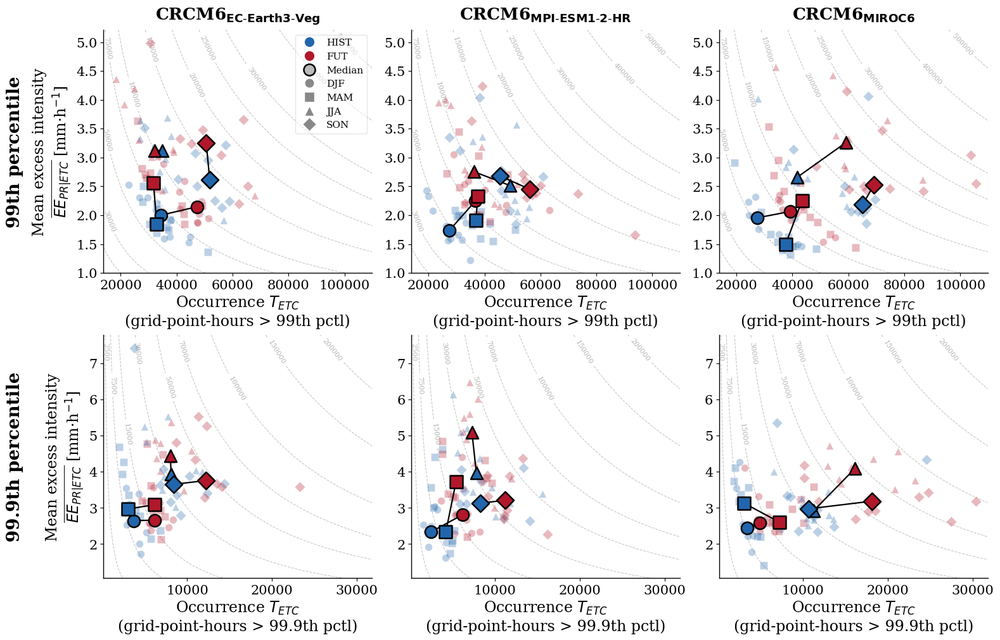

In [11]:
iso_pr = {
    99:  [2000, 3000, 5000, 7000, 10000, 20000, 30000, 50000, 75000,
            100000, 150000, 200000, 250000, 300000, 400000, 500000],
    999: [2500, 7500, 15000, 30000, 50000, 70000, 100000, 150000, 200000],
}
fig = plot_seasonal_scatter('pr', 'mm·h$^{-1}$', iso_levels=iso_pr)
plt.show()
fig.savefig(f'{base}/ALL/PLOT/scatter_top10_seasonal_storms_cumul_PR_NNA2.png', dpi=200, bbox_inches='tight')

### Occurrence vs mean intensity plane -- wind

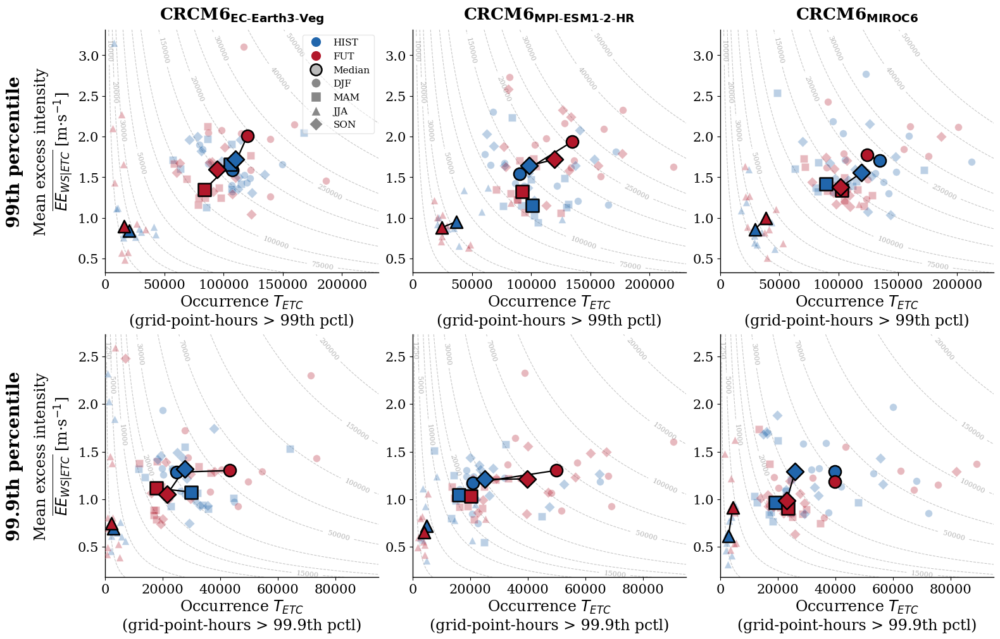

In [12]:
iso_ws = {
    99:  [10000, 20000, 30000, 50000, 75000,
            100000, 150000, 200000, 250000, 300000, 400000, 500000],
    999: [1250, 5000, 10000, 15000, 20000, 30000, 50000, 70000, 100000, 150000, 200000],
}
fig = plot_seasonal_scatter('wind', 'm·s$^{-1}$', iso_levels=iso_ws)
plt.show()
fig.savefig(f'{base}/ALL/PLOT/scatter_top10_seasonal_storms_cumul_WS_NNA2.png', dpi=200, bbox_inches='tight')

### Trajectories -- precipitation

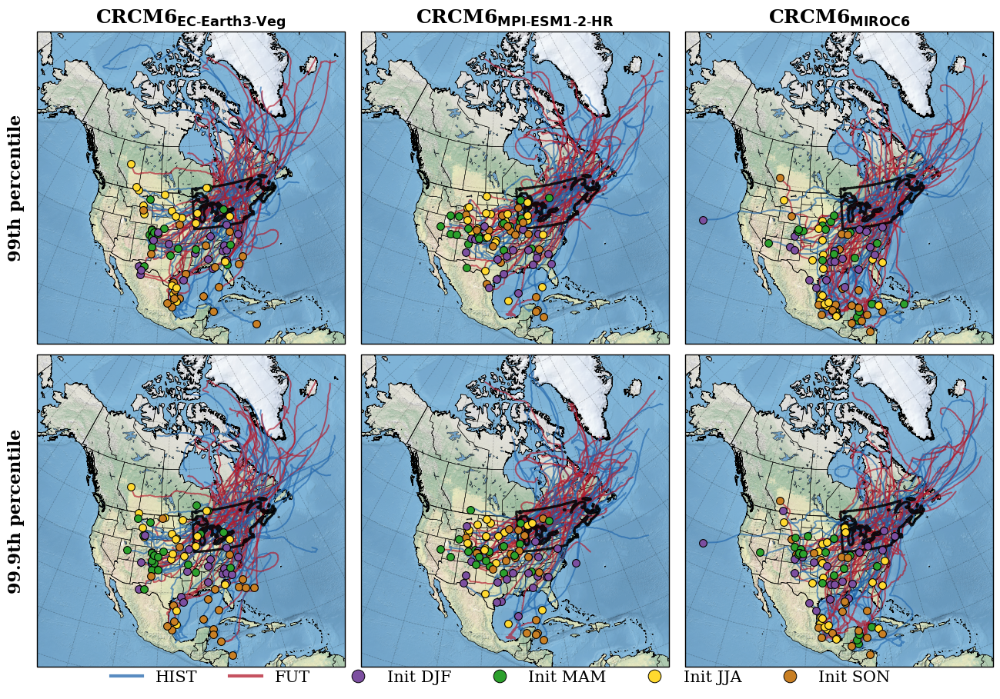

In [13]:
fig = plot_seasonal_trajectories('pr', select_by='cum')
plt.show()
fig.savefig(f'{base}/ALL/PLOT/supp_tracks_top10_seasonal_storms_cumul_PR_NNA2.png', dpi=200, bbox_inches='tight')

### Trajectories -- wind

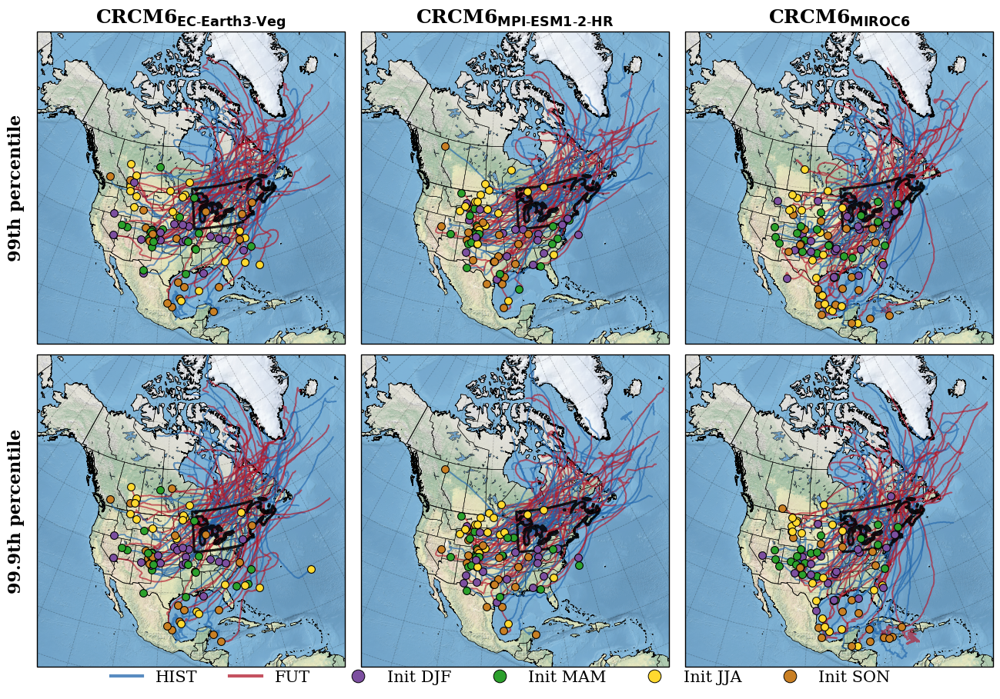

In [14]:
fig = plot_seasonal_trajectories('wind', select_by='cum')
plt.show()
fig.savefig(f'{base}/ALL/PLOT/supp_tracks_top10_seasonal_storms_cumul_WS_NNA2.png', dpi=200, bbox_inches='tight')

## 2. Seasonal top-N storms selected by regularized intensity

### Rank -- precipitation

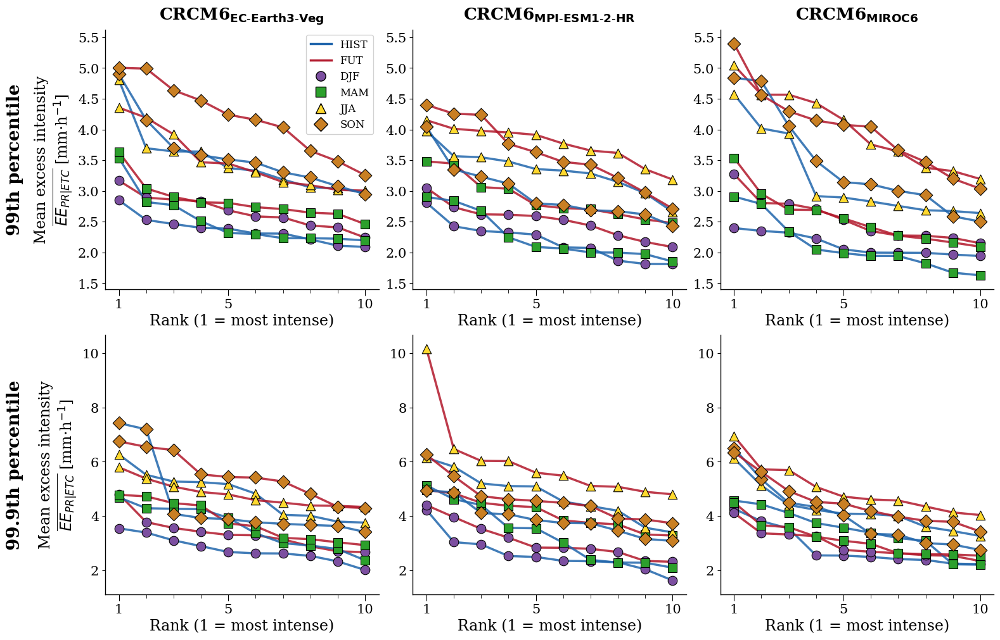

In [15]:
fig = plot_seasonal_ranks('pr', 'mm·h$^{-1}$', lambda_={99: 10000, 999: 2500})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/rank_top10_seasonal_storms_intensity_PR_NNA2.png', dpi=200, bbox_inches='tight')

### Rank -- wind

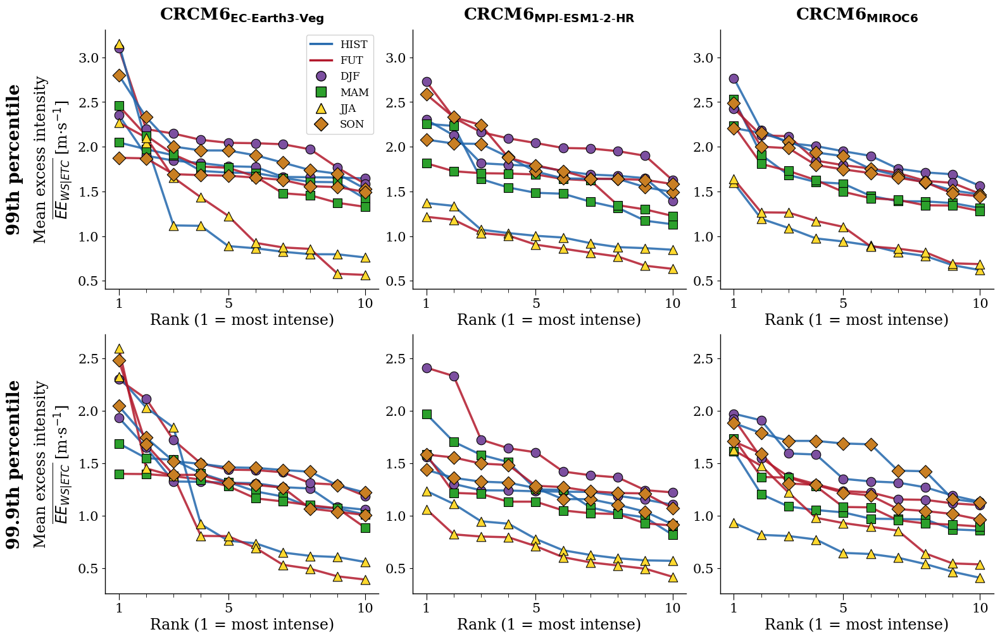

In [16]:
fig = plot_seasonal_ranks('wind', 'm·s$^{-1}$', lambda_={99: 20000, 999: 5000})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/rank_top10_seasonal_storms_intensity_WS_NNA2.png', dpi=200, bbox_inches='tight')

### Rank difference (FUT - HIST), relative [%] -- precipitation

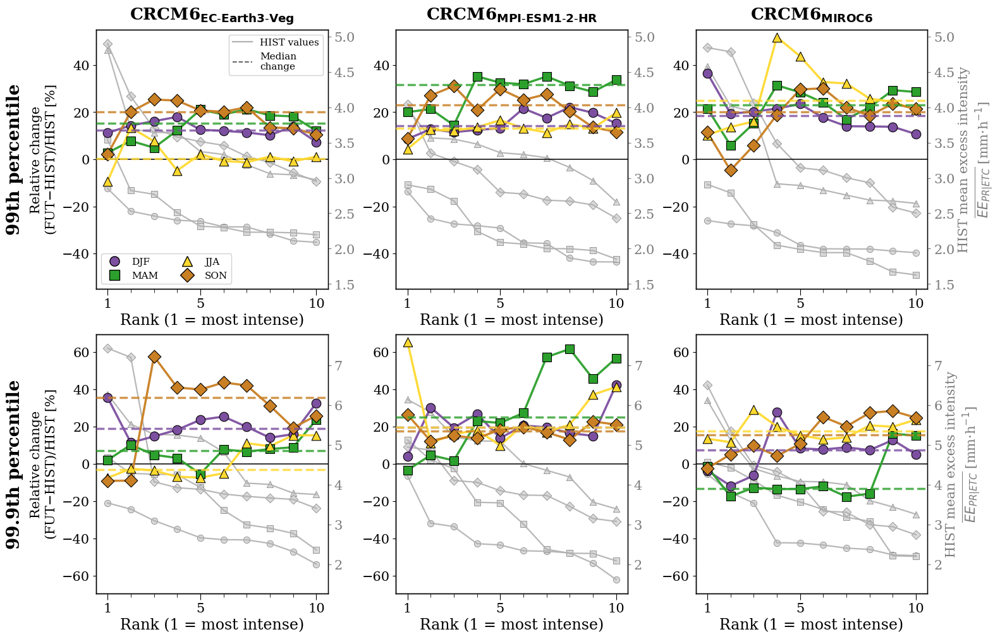

In [17]:
fig = plot_seasonal_rank_diff('pr', 'mm·h$^{-1}$', mode='relative', lambda_={99: 10000, 999: 2500})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/rankdiff_rel_top10_seasonal_storms_intensity_PR_NNA2.png', dpi=200, bbox_inches='tight')

### Rank difference (FUT - HIST), relative [%] -- wind

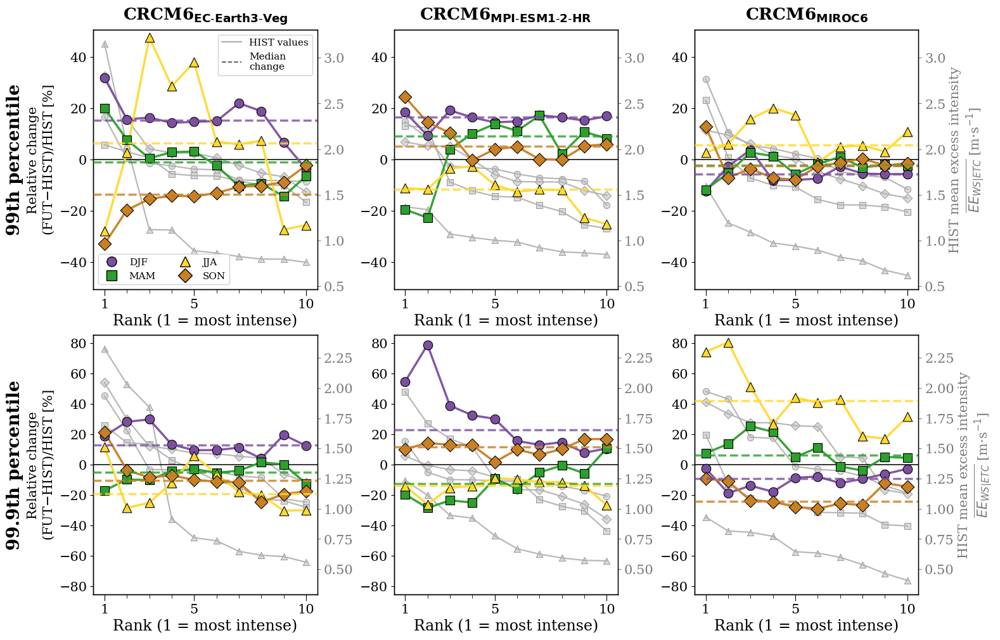

In [18]:
fig = plot_seasonal_rank_diff('wind', 'm·s$^{-1}$', mode='relative', lambda_={99: 20000, 999: 5000})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/rankdiff_rel_top10_seasonal_storms_intensity_WS_NNA2.png', dpi=200, bbox_inches='tight')

### Rank with per-season shaded HIST/FUT difference -- precipitation & wind

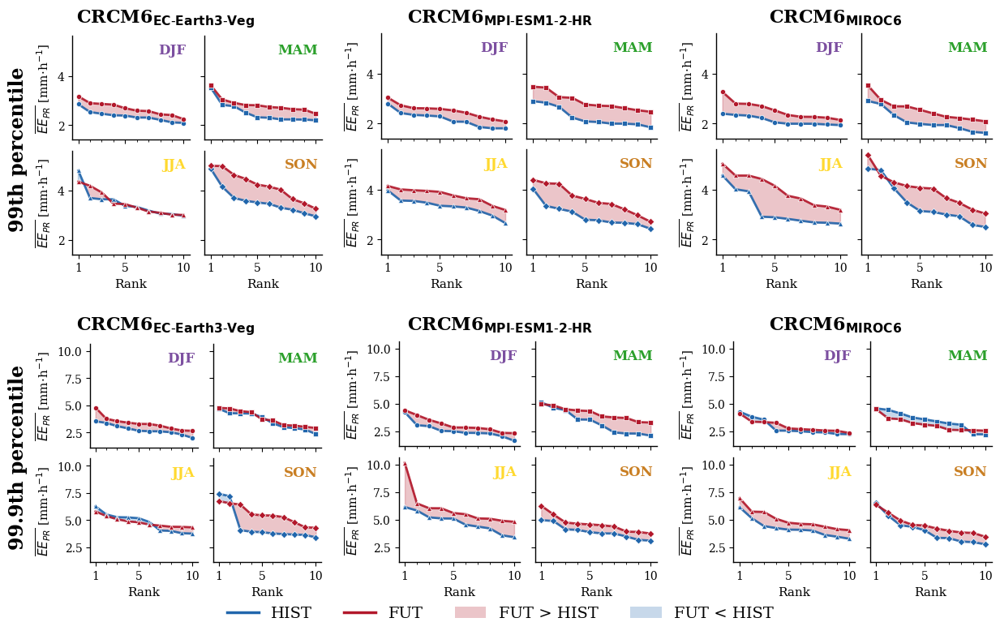

In [29]:
fig = plot_seasonal_ranks_shaded('pr', 'mm·h$^{-1}$', lambda_={99: 10000, 999: 2500})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/rankshaded_top10_seasonal_storms_intensity_PR_NNA2.png', dpi=200, bbox_inches='tight')

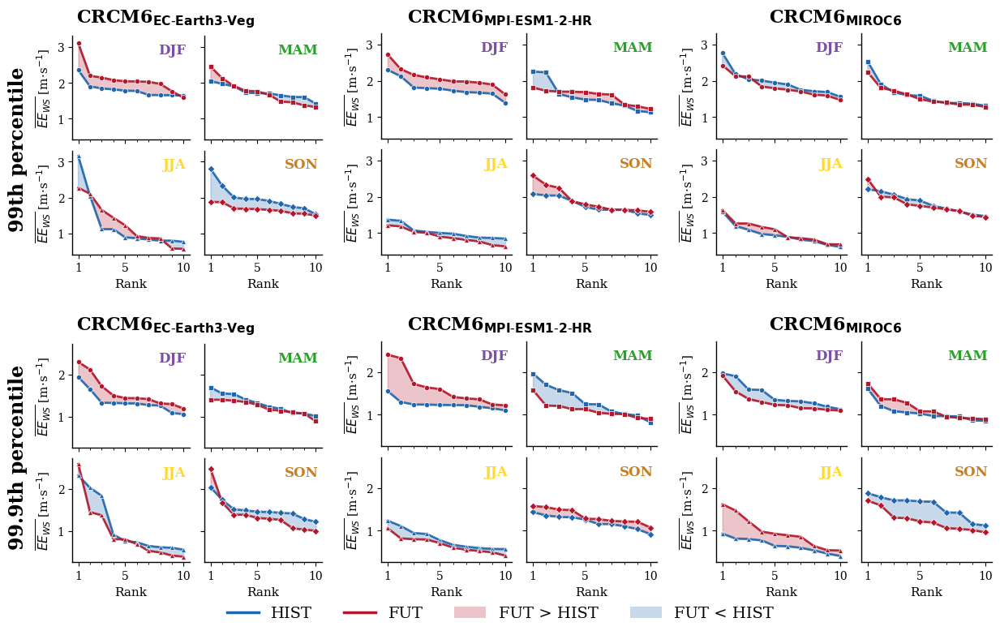

In [ ]:
fig = plot_seasonal_ranks_shaded('wind', 'm·s$^{-1}$', lambda_={99: 20000, 999: 5000})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/rankshaded_top10_seasonal_storms_intensity_WS_NNA2.png', dpi=200, bbox_inches='tight')

### Trajectories -- precipitation

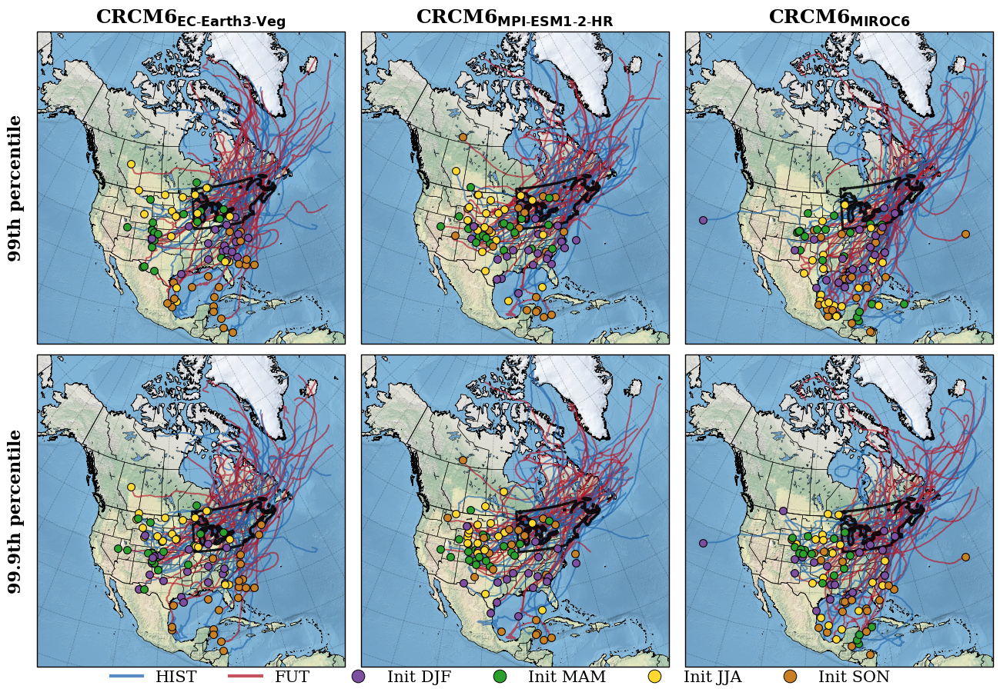

In [21]:
fig = plot_seasonal_trajectories('pr', select_by='intensity', lambda_={99: 10000, 999: 2500})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/supp_tracks_top10_seasonal_storms_intensity_PR_NNA2.png', dpi=200, bbox_inches='tight')

### Trajectories -- wind

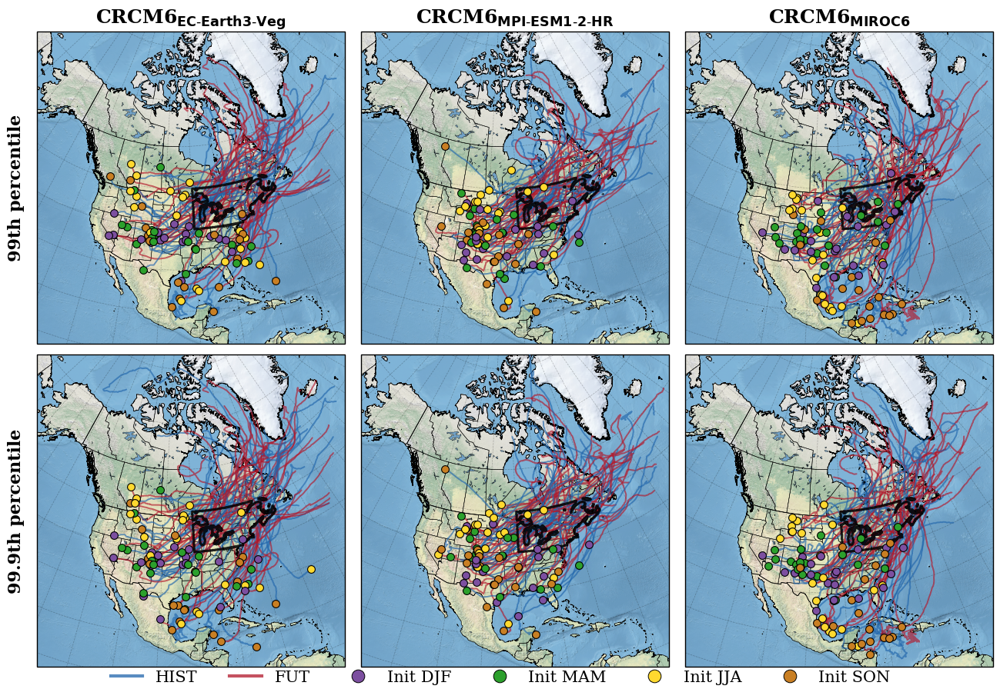

In [22]:
fig = plot_seasonal_trajectories('wind', select_by='intensity', lambda_={99: 20000, 999: 5000})
plt.show()
fig.savefig(f'{base}/ALL/PLOT/supp_tracks_top10_seasonal_storms_intensity_WS_NNA2.png', dpi=200, bbox_inches='tight')